# Two-stage image denoising by principal component analysis with local pixel grouping

**Supervisor:** Prof. Elsa Angelini

**Group:**
- Alice Valença De Lorenci
- Lais Isabelle Alves dos Santos

## Introduction

The objective of this project is to understand, implement and test the denoising method proposed in the article *Two-stage image denoising by principal component analysis (PCA) with local pixel grouping (LPG)*, by L. Zhang et. al. [1]. Essentially, the article proposes the modeling of a pixel and its neighborhood as a vector variable, from this perspective, for each pixel of the image, a group of training samples is selected with similar local spacial structures, from which a PCA transform can be estimated. In the PCA domain, the energy of the noiseless dataset concentrates on the most important components, while the energy of the noise is more evenly distributed, coefficient shrinkage can then be applied to remove the noise. This procedure is applied twice, in the first iteration or stage, most of the noise is removed, the second stage further refines the output, yielding results comparable to those of state-of-the-art algorithms.

## Implementation

In this section we shall detail the PCA-LPG algorithm and the implementation we proposed in the *Python* programming language. Support functions implemented to evaluate the results will also be presented. 

### Setup

The cells bellow are responsible for the definning the path to the folder containing relevant files, importing the necessary packages and formatting the numerical outputs of the program.

In [ ]:
# MOUNT DRIVE

# In order to be correctly imported the folders containing the images should be on the path 
# defined by the variable "path"
path = None

from google.colab import drive
drive.mount('/content/drive')

user = 'lais'
if user == 'alice':
  path = "/content/drive/My Drive/2022-2A-P1/IMA201/PROJET"
elif user == 'lais':
  path = "/content/drive/My Drive/Télécom/2A/IMA201ab/PROJET"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# RELEVANT PACKAGES

# math
import math
import numpy as np
from numpy.linalg import eig

# images
import matplotlib.pyplot as plt
import skimage as sk
from skimage import io

# support for evaluate the results
import time
import tensorflow as tf

In [ ]:
# PRE-FORMATTING

# Format numpy array display
float_formatter = "{:.2f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})

### PCA-LPG Algorithm

The Principal Component Analysis with Local Pixel Grouping (PCA-LPG) algorithm is composed of two denoising stages, the first one removes most of the noise of the image and the second one allows a refining of the ouput of the first stage, yielding a visually better result. Both stages are composed of the same procedures, as illustrated in the flowchart bellow, differing only on the noise level.

<center>
<img src=https://docs.google.com/uc?export=download&id=1FVqOjNYYvnTb9Wn4sZ55-nZpEth4R9kR width="500">
</center>

Setting up the notation, we shall denote the original image $I$ and the image corrupted by additive white gaussian noise $\upsilon$ of zero mean and standard deviation $\sigma$ as $I_\upsilon$. The goal is to obtain an estimation $\hat{I}$ of $I$ from the observation $I_\upsilon$.

In this method, a pixel ans its neighborhood are modeled as a vector variable and noise reduction is performed on the vector instead of the single pixel, which allows the preservation of image edge structures.

#### Local Pixel Grouping (LPG)

First of all, given a pixel we wish to denoise (target pixel), we consider the $K \times K$ block centered on it, and denote the block $\mathbf{x_\upsilon} = \left[ x_1, \dots, x_m\right]^T$, where $m=K^2$. 

In order to use PCA to remove the noise from $\mathbf{x_\upsilon}$ it is necessary to find training samples of the vector, those training samples are searched for within a $L \times L$ window centered on the target pixel, as illustrated bellow. Therefore, there are in total $(L-K+1)^2$ training samples for each component of $\mathbf{x_v}$, however, we will only keep the samples that are sufficiently close to the central $K \times K$ block.

<center>
<img src=https://docs.google.com/uc?export=download&id=1nE4XOXCH6-G0kGPpY873t3_FUeDymy0Z width="500">
</center>

Denote $\mathbf{x_\upsilon^0}$ the sample vector corresponding to the central $K \times K$ block and $\mathbf{x_\upsilon^i}$ the sample vector corresponding to another of the training blocks, $i=1,\dots,(L-K+1)^2-1$. Then, $\mathbf{x_\upsilon^i}$ is selected as a training sample if:
$$e_i < T + 2\sigma^2$$
where $T$ is a preset threshold ($T=25$ in the article) and $e_i$ is the mean squared error (MSE) between $\mathbf{x_\upsilon^0}$ and $\mathbf{x_\upsilon^i}$. To guarantee that there are enough training samples to adequatly compute the PCA transformation matrix, at least $c\cdot m$ samples will be selected, with increasing values of $e_i$, $c$ is a preset constant ($c=8$ in the article).

If we denote by $\mathbf{x_\upsilon^0}, \dots, \mathbf{x_\upsilon^n}$ the chosen training samples, the output of the LPG algorithm will be the training dataset $\mathbf{X_\upsilon}$:
$$\mathbf{X_\upsilon} = \left[ \mathbf{x_\upsilon^0}, \dots, \mathbf{x_\upsilon^{n-1}} \right]$$

The noiseless dataset $\mathbf X$ is then estimated from $\mathbf{X_\upsilon}$ through PCA.

The application of the LPG algorithm depends on the ```setupLPG``` and ```LPG``` methods. The first of those methods is called prior to the pixel by pixel application of the LPG and PCA algorithms, and stores all $B \times B$ blocks of the image on a matrix, in order to optimize the latter application of the LPG algorithm. The ```LPG``` method implements the algorithm itself.

In [ ]:
def setupLPG(Iv, K):
    """
    Prepare all training blocks for the LPG algorithm.

    Arguments
    -----------
    `Iv`: noisy image
    `K`: size of the training block

    Return
    -----------
    `blocks`: matrix storing all training blocks
    `IDX`: matrix with the indexes that should be used to correctly access the training blocks
    `h`: height of padded image
    `w`: width of padded image
    `N`: height of the `blocks` matrix
    `M`: width of the `blocks` matrix
    """
    
    # Padding the image so that the PCA-LGP algorithm can also be applied to the borders of the original image
    Ivpad = np.pad(Iv, ((K//2,K//2), (K//2,K//2)), 'constant', constant_values=1)

    # Dimensions of interest
    h = Ivpad.shape[0]
    w = Ivpad.shape[1]
    N = h+1-K
    M = w+1-K

    # Instantiating the matrix that will hold the training blocks
    # each block will be a column of the matrix
    blocks = np.zeros((K*K, N*M))

    k=0
    for i in range(K):
        for j in range(K):
            # Selecting the (i, j) pixels of all training blocks
            block = Ivpad[i:h+1-K+i, j:w+1-K+j].reshape(-1) 
            blocks[k,:] = block    
            k+=1

    # IDX[k] gives the index (on the padded image) of the top left pixel of the block
    IDX = np.array(range(N*M))
    IDX = IDX.reshape(N, M)
    
    return blocks, IDX, h, w, N, M

def LPG(blocks, IDX, i, j, h, w, N, M, c, s, L, K, T):
    """
    Implementation of local pixel grouping (LPG).

    Arguments
    -----------
    `blocks`: matrix holding all KxK blocks
    `i`: row of pixel under analysis
    `j`: column of pixel under analysis
    `h`: height of padded image
    `w`: width of padded image
    `N`: height of `blocks` matrix
    `M`: width of `blocks` matrix
    `c`: at least c*m (m=K**2) samples are chosen
    `s`: noise standard deviation
    `L`: size of the LxL training block
    `K`: size of the KxK sample
    `T`: threshold to acccept or reject a samples

    Return
    -----------
    `Xv`: training dataset
    """

    # Compensate for padding
    i = i + K//2
    j = j + K//2

    # Delimiting the LxL window
    rmin = max(i-L//2, 0)
    rmax = min(i+L//2-K+1, h-K)
    cmin = max(j-L//2, 0)
    cmax = min(j+L//2-K+1, w-K)

    # Retrieving the indexes to access the correct training blocks on the `blocks` matrix
    idx = IDX[rmin:rmax, cmin:cmax].reshape(-1)

    # Retrieving the training blocks
    Xv = blocks[:,idx]

    # Retrieve the training block centered on the pixel of interest
    offset = (i-K//2)*M + (j-K//2)
    x0 = blocks[:, offset].reshape(-1,1)

    # Compute distance of each sample to the target block and order samples by distance
    dis = np.mean((Xv - x0)**2, axis=0)
    idx = np.argsort(dis)
    dis = dis[idx]
    Xv = Xv[:, idx]

    # Select samples that are close enough to target block (or until minimum number is met)
    thresh = T+2*s**2
    l = 0
    nsamp = c*(K**2)
    while l < Xv.shape[1] and (dis[l] < thresh  or l < nsamp):
        l += 1

    return Xv[:,:l]

#### Principal Component Analysis (PCA)

The PCA is a decorrelation method in statistical signal process, i.e, the technique has the goal of reducing the autocorrelation (similarity) of a given signal without loosing its principal features. When a certain noisy dataset $\mathbf{X_\upsilon}$ is given as input to the PCA algorithm, the resulting dataset is a good approximation for removing the noise, since only the most important components of it will be preserved.

To implement the algorithm itself, we considered a noisy dataset $\mathbf{X_\upsilon}$ of size $m \times n$ with additive white gaussian noise of variation equal to $\sigma^2$, also called *training dataset* computed with the ```LPG``` algorithm. It is composed of $m$ row vectors $X_i^\upsilon$ with $n$ components each of them: 

$$\mathbf{X_\upsilon} = \left[ ({X_{1}^{\upsilon}})^T, \dots, ({X_{m}^{\upsilon}})^T \right]^T$$

The first step is to centralize the dataset $\mathbf{X_\upsilon}$, to allow the application of PCA. The centralized dataset can be computed by: 

$$ \bar{X}_{k}^{v} = X_{k}^{v} - \mu_k $$ 
$$ \mu_k = \frac{1}{n} \sum_{i=1}^{n} X_{k}^{v}(i) $$

Notice that $\mu_k$ is the mean value of the sample vector $\mu_k=\bar{X}_{k}^{v}$.

\\
From the centralized noised dataset $\mathbf{\bar{X}_\upsilon}$ it is possible to obtain an estimation of the noiseless centralized dataset $\mathbf{\hat{\bar{X}}}$.

The next step is to calculate the covariance matrix $\mathbf{\Omega}_\mathbf{\bar{X}_\upsilon}$ of the noisy centralized dataset. The goal in this part of the method is to obtain the PCA transformation matrix $\mathbf{P}_\mathbf{\bar{X}}$, a matrix that allows the dataset to be mapped into the PCA domain. This matrix should be obtained from the covariance of the noiseless centralized dataset, however it can be proved through the following equations that  $\mathbf{P}_\mathbf{\bar{X}}$, associated with $\mathbf{\Omega}_\mathbf{\bar{X}}$, is in fact the same matrix associated with $\mathbf{\Omega}_\mathbf{\bar{X}_\upsilon}$:

$$ \mathbf{\Omega}_\mathbf{\bar{X}_\upsilon} = \mathbf{\Omega}_\mathbf{\bar{X}} + \mathbf{\Omega}_\upsilon $$

$$ \mathbf{\Omega}_\upsilon = \sigma^2I $$ $I$ being the identity matrix. Thus the eigenvector matrix of $\mathbf{\Omega}_\mathbf{\bar{X}_\upsilon}$ is the same as the one of $\mathbf{\Omega}_\mathbf{\bar{X}}$:

$$ \mathbf{P}_\mathbf{\bar{X}} = \Phi_\mathbf{\bar{X}}^{T} = \Phi_\mathbf{\bar{X}_\upsilon}^{T} $$

The centralized noisy dataset in the PCA domain is computed as: 

$$ \mathbf{\bar{Y}}_\upsilon = \mathbf{P}_\mathbf{\bar{X}} \mathbf{\bar{X}_\upsilon} $$

To suppress the noise from $\mathbf{\bar{Y}}_\upsilon$, the technique used in [1] is the Linear Minimum Mean Square-Error Estimation (LMMSE), an estimation method to minimize the Mean Square Error (MSE), resulting in a denoised matrix. To do that, it is computed for each row of $\mathbf{\bar{Y}}_\upsilon$ the shrinkage coefficient $w_k$:

$$ w_k = \frac{\mathbf{\Omega}_\mathbf{\bar{y}}(k,k)}{\mathbf{\Omega}_\mathbf{\bar{y}}(k,k) + \mathbf{\Omega}_{\upsilon_y}(k,k)} $$

where $\mathbf{\Omega}_\mathbf{\bar{y}} = \mathbf{\Omega}_\mathbf{\bar{y}_\upsilon} - \mathbf{\Omega}_{\upsilon_y}$ and $\mathbf{\Omega}_{\upsilon_y}$ is the covariance matrix of the noise dataset $\mathbf{V}_\mathbf{Y}$. Each row is then updated as:
$$ \bar{Y}_k = w_k \cdot \bar{Y}_{\upsilon}^{k}$$

In the code, in order to implement these equations, the diagonal of the covariance matrix $\mathbf{\Omega}_\mathbf{\bar{y}_\upsilon}$ of the centralized noisy dataset is computed as the mean square of $\mathbf{\bar{Y}}_\upsilon$, since the diagonal is the part that matters. Also, this covariance matrix can be represented as $\mathbf{\Omega}_\mathbf{\bar{y}} + \mathbf{\Omega}_{\upsilon_y}$, thus, this matrix can also be used as the denominator of $w_k$. 

To avoid zeros in the denominator of the shrinkage coefficients, it can be proved that, if:

$$\mathbf{\Omega}_\mathbf{\bar{y}}(k,k) = \mathbf{\Omega}_\mathbf{\bar{y}_\upsilon}(k,k) - \mathbf{\Omega}_{\upsilon_y}(k,k) \le 0$$

then, $\bar{Y}_{\upsilon}^{k}$ should be set to zero. For that purpose, the code computes the difference and, if less than zero, $w_k$ it is set to zero.

Finally, the denoised dataset can be obtained from $\mathbf{\bar{Y}}$ if it is multiplied by the inverse of the PCA transformation matrix and the mean values are added to this result. The target denoised pixel is then extracted from the denoised dataset.



In [ ]:
def PCA(Xv, s):
  """
  Implementation of the PCA algorithm on the sample matrix returned by 
  the LPG method. Technique to remove the noise by transforming the noisy 
  dataset into the PCA domain, and preserving only significant components.

  Arguments
  -----------
  `Xv`: noising dataset
  `s`: noise standard deviation

  Return
  -----------
  `x0`: central pixel of the central block
  """

  # Sample vector size
  m = Xv.shape[0]
  # Number of samples
  n = Xv.shape[1]

  # Centralize the noised dataset
  mu = np.mean(Xv, axis=1, keepdims=True)
  Xv_cent = Xv - mu

  # Convariance matrix of the centralized noised dataset
  cov_Xv_cent = Xv_cent@Xv_cent.T / n 

  # Eigendecomposition of the covariance matrix
  e_val, e_vec = eig(cov_Xv_cent)

  # PCA transformation matrix
  Px = e_vec.T

  # Transformed noisy dataset
  Yv_cent = Px@Xv_cent

  # Shrinkage coefﬁcients
  cov_Yv_cent_diag = np.mean(Yv_cent**2, axis=1, keepdims=True)
  cov_Y_cent_diag = np.maximum(0, cov_Yv_cent_diag - s**2)
  w = [cov_Y_cent_diag[i,0] / cov_Yv_cent_diag[i,0] if cov_Y_cent_diag[i,0] != 0 else 0 for i in range(m)]

  # Get a column vector
  w = np.array(w).reshape(-1,1)

  # Decorrelated (denoised) dataset
  Yb = Yv_cent * w
  
  # Transforming back to the time domain
  Xb = Px.T@Yb

  # Denoised dataset (adding back the mean values)
  X = Xb + mu

  # Selecting the denoised target central pixel
  x0 = X[m//2, 0]

  return x0

#### Noise level update

The initially strong noise level in the original image might lead to LPG erros when selecting training samples. Therefore, in order to improve the results, a second stage is applied, since most of the noise has been removed in the first stage, the LPG accuracy can be improved. The noise level is updated according to the following equation:
$$σ_s = c_s ⋅ \sqrt{σ^2 - E[\tilde{I}^2]}$$

where $σ_s$ is the new estimated standard deviation, $c_s$ is a preset constant and $\tilde{I} = I_v - \hat{I}$ is the difference between the noisy image and the first stage denoised image.

In [ ]:
def updateNoiseLevel(Iv, Ih, s, cs=0.35):
    """
    Implementation of noise level update, between the first and 
    second stages of the algorithm.

    Arguments
    -----------
    `Iv`: noisy image
    `Ih`: denoised image (after first stage)
    `s`: noise standard deviation
    `cs`: constant of formula (3.17)

    Return
    -----------
    `ss`: residual noise
    """
    
    It = Iv - Ih
    ss = cs*np.sqrt(np.abs(s**2 - np.mean(It**2)))
    
    return ss

#### Pipeline

The LPG-PCA algorithm, globally, is implemented in the function ```PCAdenoising``` bellow. Before each stage of the algorithm, all $K \times K$ blocks of the image are selected by the ```setupLPG``` function, with the purpose of optimizing the application of LPG, thus reducing the execution time of the LPG-PCA algorithm. 

The first and second stage are identicals. For each pixel, the ```LPG``` and the ```PCA``` functions are called, resulting in the denoised pixel, which extracted from the training block that is centered on it. Each denoised pixel is then attributed to the denoised image matrix.

Between the first and second stages, the level of noise is updated with ```updateNoiseLevel```, according to the hyperparameter $c_s$.

In [ ]:
def PCAdenoising(Iv, s, L=41, K=5, c=8, T=25, cs=0.35, verbose=0):
  """
  Two-stage image denoising by principal component analysis with local
  pixel grouping. The default values of the parameters are those used on
  the article.

  Arguments
  -----------
  `Iv`: noisy image
  `s`: noise standard deviation (the noise is supposed white additive with zero mean and standard deviation s)
  `L`: size of the LxL training block
  `K`: size of the KxK sample
  `c`: at least c*m (m=K**2) samples are chosen
  `T`: threshold to acccept or reject a samples
  `cs`: constant of formula (3.17)
  `verbose`: logging level (0: no logging, 1: print elapsed time, 2: print progression)

  Return
  -----------
  `Ih`: first stage output
  `Ihh`: second stage output (denoised image)
  """

  ## FIRST STAGE

  # Keep track of time to execute the first stage
  time1 = time.time()

  # Support data structures for the LPG algorithm (matrix with all KxK blocks of Iv)
  blocks, IDX, h, w, N, M = setupLPG(Iv, K)

  Ih = Iv.copy()

  # First stage of LPG-PCA
  for i in range(0, Iv.shape[0]):
    for j in range(0, Iv.shape[1]):
      if verbose > 1:
        print("\rPixel: [{},{}]".format(i,j), end='')

      # Select training samples through LPG
      Xv = LPG(blocks, IDX, i, j, h, w, N, M, c, s, L, K, T)
      # Denoising through PCA
      x0 = PCA(Xv, s)
      # Denoised pixel
      Ih[i,j] = x0

  if verbose > 0:
    print("\r[FIRST STAGE] Elapsed time: {:.4f}s\n".format(time.time()-time1))

  ## SECOND STAGE 

  # Update noise level
  ss = updateNoiseLevel(Iv, Ih, s, cs=cs)

  # Keep track of time to execute the second stage
  time2 = time.time()

  blocks, IDX, h, w, N, M = setupLPG(Ih, K)

  Ihh = Ih.copy()

  # Second stage of LPG-PCA
  for i in range(0, Ih.shape[0]):
    for j in range(0, Ih.shape[1]):
      if verbose > 1:
        print("\rPixel: [{},{}]".format(i,j), end='')
      
      Xv = LPG(blocks, IDX, i, j, h, w, N, M, c, s, L, K, T)
      x0 = PCA(Xv, ss)
      Ihh[i,j] = x0

  if verbose > 0:
    print("\r[SECOND STAGE] Elapsed time: {:.4f}s\n".format(time.time()-time2))

  return Ih, Ihh

## Support Functions

The support functions implemented in the code blocks bellow are used in the main pipeline, in which the LPG-PCA structure is implemented itself, and as a support to evaluate the application of the algorithm in question to different images. The purpose of each of them is as follows:

*   ***Noise***: The noise generated is described by the gaussian distribution with mean $μ=0$ and variance $σ^2$. First, a random array is generated according to the standard normal distribution,  the variance of the array is then normalized and its standard deviation is set to $\sigma$. The noise is then added to the original image:
$$ I_{noised} = I + \upsilon$$

*   ***View Image***: Function to plot a desired image, with the aim of avoiding repetitive code.
*   ***View Images***: View multiple images all at once. Used as well to set the plot properties.
*   ***Adjust Dynamic Range***: Function that sets the range of the image to values between $0$ and $255$. By default, the values are set to integers.
*   ***PSNR***: Computes the PSNR (Peak Signal-to-Noise Ratio) in decibels, as specified in [2], using the *Tensorflow* package.
*   ***SSIM***: Computes the SSIM (Structural Similarity Index Measure), as specified in [3], also using the *Tensorflow* package.
*   ***Prepare Image***: In most cases, the LPG-PCA algorithm is applied to just one part of the image, since the goal is to analyse whether the image is properly denoised in specific regions. Considering that, the purpose of this function is to crop the image.

The remaining support functions are pipelines. Four types of analysis are taken into consideration in this work, whereby the LPG-PCA algorithm is applied to a synthetic image; images from the article, with fixed or variable hyperparameters; and medical images. As a considerable ammount of images are analysed and in order to avoid code repetition, the pipelines run the algorithm discussed for each group of images of the *Evaluation* section. 

For that purpose, three types of pipelines were implemented: ```syntheticImagePypeline``` for synthetic images; the ```imagePipeline``` for both article and medical images, and the ```hyperparameterPipeline```, to analyse the impact of hyperparameters.

In [ ]:
def noise(im, s):
    """ 
    Adds white gaussian noise to the image of zero mean and s standard deviation.

    Arguments
    -----------
    `im`: image
    `s`: noise standard deviation

    Return
    -----------
    `imt`: noisy image
    """

    # Apply random noise - based on the code of the article
    imt = im.copy()
    sh = imt.shape 
    
    # create a random noise array of dimension *sh
    noise = np.random.randn(*sh)
    noise = noise / np.sqrt(np.mean(noise**2))

    imt = imt + s*noise
     
    return imt

In [ ]:
def viewImage(im, title=None, figsize=(6,6)):
  """
  Display gray level image.

  Arguments
  -----------
  `im`: image
  `title`: image title
  `figsize`: figure size (tuple)
  """

  plt.figure(figsize=figsize)
  plt.imshow(im, vmin=0, vmax=255, cmap='gray')
  
  if title:
    plt.title(title, fontsize=14)
  plt.axis('off')
  plt.show()

In [ ]:
def viewImages(ims, titles=None, ncols=4):
  """
  Display multiple gray level images as subplots.

  Arguments
  -----------
  `ims`: list of images
  `title`: list of image titles
  `ncols`: number of columns used to display images
  """
  
  n = len(ims)
  nrows = int(np.ceil(n/ncols))

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5*ncols, 6*nrows))
  axs = axs.reshape(-1)

  for i in range(n):
    axs[i].imshow(ims[i], vmin=0, vmax=255, cmap='gray')
    if titles:
      axs[i].set_title(titles[i], fontsize=12)

  for ax in axs:
    ax.axis('off')

  plt.show()

In [ ]:
def adjustDynamicRange(im, to_int=True):
  """
  Convert to integers and adjust dynamic range to [0, 255]: crop values 
  above and bellow allowed range.

  Arguments
  -----------
  `im`: image
  `range`: dynamic range

  Return
  -----------
  `imt`: adjusted image
  """
  
  range=[0,255]

  imt = im.copy()
  imt[imt<range[0]] = range[0]
  imt[imt>range[1]] = range[1]

  if to_int:
    imt = np.uint8(imt)

  return imt

In [ ]:
def PSNR(im1, im2, max_value=255):
  """
  Compute the PSNR value in dB.

  Arguments
  -----------
  `im1`: first image
  `im2`: second image
  `max_value`: dynamic range of the images

  Return
  -----------
  `PSNR`: PSNR value in dB
  """

  PSNR = tf.image.psnr(im1.reshape(*im1.shape, 1), 
                       im2.reshape(*im2.shape, 1), 
                       max_val=max_value).numpy()
  
  return PSNR

def SSIM(im1, im2, max_value=255):
  """
  Compute the SSIM value.

  Arguments
  -----------
  `im1`: first image
  `im2`: second image
  `max_value`: dynamic range of the images

  Return
  -----------
  `SSIM`: SSIM value
  """

  SSIM = tf.image.ssim(im1.reshape(*im1.shape, 1), 
                       im2.reshape(*im2.shape, 1), 
                       max_val=max_value).numpy()
  
  return SSIM

In [ ]:
def prepareImage(path, rx1, rx2, ry1, ry2):
  """
  Load target image and resize it to be properly used in the
  algorithm.

  Arguments
  -----------
  `path`: image path
  `rx1`: Bound left pixel
  `rx2`: Bound rigth pixel
  `ry1`: Bound upper pixel
  `ry2`: Bound lower pixel

  Returns  
  -----------
  `Im`: prepared image
  """
  
  # Load image
  print("\nORIGINAL IMAGE")
  rawIm = sk.io.imread(path)
  if len( rawIm.shape ) == 3:
    rawIm = rawIm.mean(axis=2)
  viewImage(rawIm)
  print("Image shape: {}".format(rawIm.shape))

  # Selecting the relevant part of the image
  print("\nRESIZED IMAGE")
  Im = rawIm[rx1:rx2, ry1:ry2].astype('float64')
  viewImage(Im, figsize=(8, 8))
  print("Image shape: {}".format(Im.shape))

  return Im

In [ ]:
def syntheticImagePypeline(N, s, name='synthetic', random_seed=0):
  """
  Apply the PCA-LPG algorithm to a synthetic image (light square upon dark background).

  Arguments
  -----------
  `N`: size of the image
  `s`: standard deviation of the noise to be added to image
  `name`: image name
  `random_seed`: fix seed of random number engine

  Return
  -----------
  `syntheticIh`: first stage denoised image
  `syntheticIhh`: second stage denoised image
  """
  
  # Generates the synthetic image
  syntheticI = np.ones((N,N))*10
  syntheticI[N//2-N//4:N//2+N//4+1, N//2-N//4:N//2+N//4+1] = 200

  # Add gaussian noise
  np.random.seed(random_seed)
  syntheticIv = noise(syntheticI, s)

  # View original and noisy images
  titles = ['Synthetic Image', 'Noisy Synthetic Image']
  imgs = [syntheticI, syntheticIv]

  print("SYNTHETIC IMAGE\n")
  viewImages(imgs, titles=titles, ncols=2)

  # Call the LPG-PCA denoising algorithm
  print("\nPCA-LPG ALGORITHM")
  syntheticIh, syntheticIhh = PCAdenoising(syntheticIv, s, verbose=1)

  # View Results
  print("\nRESULTS")
  titles = ['First Stage', 'Second Stage']
  imgs = [syntheticIh, syntheticIhh]
  viewImages(imgs, titles=titles, ncols=2)
  
  # save results
  sk.io.imsave(path + "/results/{}Ih_s={}.png".format(name, s), adjustDynamicRange(syntheticIh))
  sk.io.imsave(path + "/results/{}Ihh_s={}.png".format(name, s), adjustDynamicRange(syntheticIhh))

  # metrics
  print("\nMETRICS")
  psnrIh = PSNR(syntheticI, syntheticIh)
  ssimIh = SSIM(syntheticI, syntheticIh) 
  psnrIhh = PSNR(syntheticI, syntheticIhh)
  ssimIhh = SSIM(syntheticI, syntheticIhh) 

  print('================ Standard Deviation: {} ================'.format(s))
  print('Denoised Image (1st Stage) --- PSNR: {:.1f}, SSIM: {:.4f}'.format(psnrIh, ssimIh))
  print('Denoised Image (2st Stage) --- PSNR: {:.1f}, SSIM: {:.4f}\n'.format(psnrIhh, ssimIhh))

  return syntheticIh, syntheticIhh

In [ ]:
def imagePipeline(I, name, listS=[10,20,30,40], random_seed=0):
  """
  Apply the PCA-LPG algorithm to an image for different noise levels.

  Arguments
  -----------
  `I`: image
  `name`: image title
  `listS`: list of standard deviation
  `random_seed`: fix seed of random number engine

  Return
  -----------
  `listIh`: first stage denoised image
  `listIhh`: second stage denoised image
  """
  
  # adding noise
  np.random.seed(random_seed)

  listIv = []
  for s in listS:
    listIv.append(noise(I, s))

  print("NOISY IMAGES")
  viewImages(listIv, titles=["$\sigma=${}".format(s) for s in listS])
  
  # PCA-LPG algorithm
  listIh = []
  listIhh = []

  print("\nPCA-LPG ALGORITHM")
  for Iv, s in zip(listIv, listS):
    print("================ s: {} ================".format(s))
    Ih, Ihh = PCAdenoising(Iv, s, cs=0.35, verbose=1)
    listIh.append(Ih)
    listIhh.append(Ihh)

  # view results
  ## first stage
  print("\nFIRST STAGE RESULTS")
  viewImages(listIh, titles=["$\sigma=${}".format(s) for s in listS])
  ## second stage
  print("\nSECOND STAGE RESULTS")
  viewImages(listIhh, titles=["$\sigma=${}".format(s) for s in listS])
  
  # save results
  for Ih, Ihh, s in zip(listIh, listIhh, listS):
    sk.io.imsave(path + "/results/{}Ih_s={}.png".format(name, s), adjustDynamicRange(Ih))
    sk.io.imsave(path + "/results/{}Ihh_s={}.png".format(name, s), adjustDynamicRange(Ihh))

  # metrics
  print("\nMETRICS")
  for Iv, Ih, Ihh, s in zip(listIv, listIh, listIhh, listS):
    psnrIv = PSNR(I, Iv)
    ssimIv = SSIM(I, Iv) 
    psnrIh = PSNR(I, Ih)
    ssimIh = SSIM(I, Ih) 
    psnrIhh = PSNR(I, Ihh)
    ssimIhh = SSIM(I, Ihh) 
    print('================ Standard Deviation: {} ================'.format(s))
    print('Noisy Image ------------------ PSNR: {:.1f}, SSIM: {:.4f}'.format(psnrIv, ssimIv))
    print('Denoised Image (1st Stage) --- PSNR: {:.1f}, SSIM: {:.4f}'.format(psnrIh, ssimIh))
    print('Denoised Image (2st Stage) --- PSNR: {:.1f}, SSIM: {:.4f}\n'.format(psnrIhh, ssimIhh))

  return listIh, listIhh

In [ ]:
def hyperparameterPipeline(I, name, hyperName, hyperList, s=20, random_seed=0):
  """
  Apply the PCA-LPG algorithm to an image for different noise levels.

  Arguments
  -----------
  `I`: image
  `name`: image name
  `hyperName`: name of the hyperparameter (L, K or cs)
  `hyperList`: list of hyperparameter values
  `s`: standard deviation
  `random_seed`: fix seed of random number engine

  Return
  -----------
  `listIh`: first stage denoised image
  `listIhh`: second stage denoised image
  """
  
  if hyperName not in ['L', 'K', 'cs', 'T', 'c']:
    print("[ERROR] Unkown hyperparameter.")
    return None, None

  # adding noise
  np.random.seed(random_seed)
  Iv = noise(I, s)

  print("NOISY IMAGE")
  viewImages([I, Iv], titles=["Original image", "Noisy image (s={})".format(s)], ncols=2)
  
  # PCA-LPG algorithm
  listIh = []
  listIhh = []

  print("\nPCA-LPG ALGORITHM")
  for hyperValue in hyperList:
    print("================ {}={} ================".format(hyperName, hyperValue))
    if hyperName == 'L':
      Ih, Ihh = PCAdenoising(Iv, s, L=hyperValue, verbose=1)
    elif hyperName == 'K':
      Ih, Ihh = PCAdenoising(Iv, s, K=hyperValue, verbose=1)
    elif hyperName == 'cs':
      Ih, Ihh = PCAdenoising(Iv, s, cs=hyperValue, verbose=1)
    elif hyperName == 'T':
      Ih, Ihh = PCAdenoising(Iv, s, T=hyperValue, verbose=1)
    elif hyperName == 'c':
      Ih, Ihh = PCAdenoising(Iv, s, c=hyperValue, verbose=1)
    listIh.append(Ih)
    listIhh.append(Ihh)

  # view results
  ## first stage
  print("\nFIRST STAGE RESULTS")
  viewImages(listIh, titles=["{}={}".format(hyperName, hyperValue) for hyperValue in hyperList], ncols=3)
  ## second stage
  print("\nSECOND STAGE RESULTS")
  viewImages(listIhh, titles=["{}={}".format(hyperName, hyperValue) for hyperValue in hyperList], ncols=3)
  
  # save results
  for Ih, Ihh, hyperValue in zip(listIh, listIhh, hyperList):
    sk.io.imsave(path + "/results/{}Ih_{}={}.png".format(name, hyperName, hyperValue), adjustDynamicRange(Ih))
    sk.io.imsave(path + "/results/{}Ihh_{}={}.png".format(name, hyperName, hyperValue), adjustDynamicRange(Ihh))

  # metrics
  print("\nMETRICS")
  for Ih, Ihh, hyperValue in zip(listIh, listIhh, hyperList):
    psnrIv = PSNR(I, Iv)
    ssimIv = SSIM(I, Iv) 
    psnrIh = PSNR(I, Ih)
    ssimIh = SSIM(I, Ih) 
    psnrIhh = PSNR(I, Ihh)
    ssimIhh = SSIM(I, Ihh) 
    print('======================= {}={} ======================='.format(hyperName, hyperValue))
    # print('Noisy Image ------------------ PSNR: {:.1f}, SSIM: {:.4f}'.format(psnrIv, ssimIv))
    print('Denoised Image (1st Stage) --- PSNR: {:.1f}, SSIM: {:.4f}'.format(psnrIh, ssimIh))
    print('Denoised Image (2st Stage) --- PSNR: {:.1f}, SSIM: {:.4f}\n'.format(psnrIhh, ssimIhh))

  return listIh, listIhh

## Evaluation

### Synthetic Image

First of all, as a proof of concept, we tested the algorithm with a simple synthtetic image, consisting of a light square upon a dark background. Such a test is useful since we know exactly what the ideal denoised image should be. The results can be observed bellow.

SYNTHETIC IMAGE



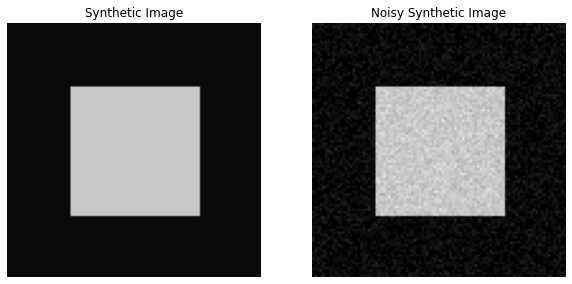


PCA-LPG ALGORITHM
[FIRST STAGE] Elapsed time: 25.2632s

[SECOND STAGE] Elapsed time: 29.0733s


RESULTS


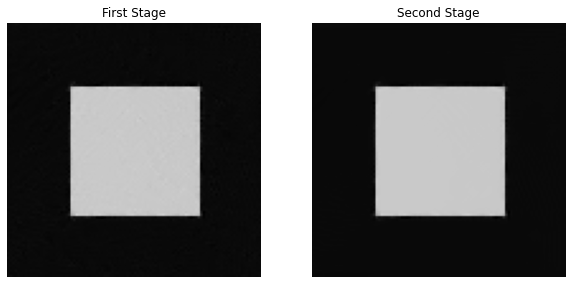


METRICS
================ Standard Deviation: 10 ================
Denoised Image (1st Stage) --- PSNR: 42.3, SSIM: 0.9821
Denoised Image (2st Stage) --- PSNR: 44.3, SSIM: 0.9982



In [ ]:
N = 100  # size of the image (NxN)
s = 10   # standard deviation of the noise
syntheticIh, syntheticIhh = syntheticImagePypeline(N, s)

We see that, visually, the algorithm succesfully denoised the image, and we can observe some improvements when comparing the ouput of the first stage to that of the second stage. This observation is confirmed by the application of the PSNR and SSIM metrics.

The PSNR (Peak Signal to Noise Ration) [2] metric measures the intensity difference between two images and is tipically used to quantify in decibels (dB) the quality of the restored image. Given a noise free image $I$ and a noisy version $I_\upsilon$, the PSNR is defined in terms of the MSE (Mean Squared Error) and the MAX$_I$ (maximum pixel value of $I$):
$${\displaystyle {\mathit {MSE}}={\frac {1}{m\,n}}\sum _{i=0}^{m-1}\sum _{j=0}^{n-1}[I(i,j)-I_\upsilon(i,j)]^{2}}$$
$${\displaystyle {\begin{aligned}{\mathit {PSNR}}&=10\cdot \log _{10}\left({\frac {{\mathit {MAX}}_{I}^{2}}{\mathit {MSE}}}\right)\end{aligned}}}$$

The PSNR often fails to describe the visual perception quality of an image, for this, the SSIM (Structural Similarity Index Metric) [3] index in commonly used, it reflects the structural similarity between two images. The SSIM takes values between $-1$ and $1$, where $1$ indicates perfect correlation, $0$ no similarity and $-1$ perfect anti-correlation.

Furthermore, as a first analysis, we notice that, altough borders and corners are preserved, the denoising is more effective on homogeneous regions. This is explained by the reliance of the algorithm on finding training samples similar to the neighborhood of the target pixel: evidently, for homogeneous regions there will many more similar training samples then for borders or corners. However, that same restriction of only using samples with similar local spacial structures is what guarantees the preservation of image edge structures.

### Reproducing results from the article

Two images presented on the article (*Cameraman* and *Barbara*) were chosen to evaluate the algorithm results using the PSNR and SSIM metrics. Also, aspects such as the performance of the denoising algorithm on background objects and textures can be analysed.

It is worthwhile noticing that the results obtained are slightly different then the ones of the article as, for this project, the standard algorithm was implemented, in which the restored value is taken as the estimate obtained from the window centered on the pixel. On the other hand, the authors used a variation of the algorithm in which the restored value at a pixel is set as the average of all the estimates obtained by all windows containing the pixel.

#### Cameran

Bellow, the PCA-LPG algorithm was applied to the *Cameraman* image for noise levels $\sigma = 10,20,30$ and $40$.


ORIGINAL IMAGE


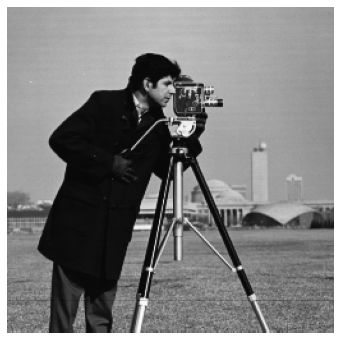

Image shape: (256, 256)

RESIZED IMAGE


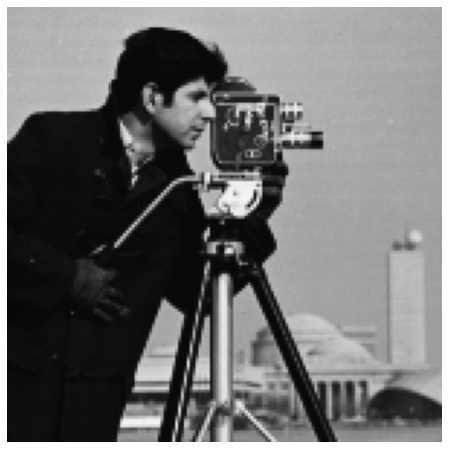

Image shape: (150, 150)


In [ ]:
# CAMERAMAN IMAGE

cameramanI = prepareImage(path+"/paper_images/cameraman.tif", 30, 180, 60, 210)

NOISY IMAGES


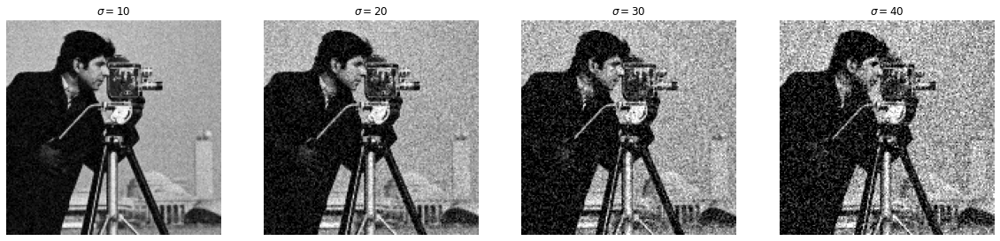


PCA-LPG ALGORITHM
================ s: 10 ================
[FIRST STAGE] Elapsed time: 43.8586s

[SECOND STAGE] Elapsed time: 47.6184s

================ s: 20 ================
[FIRST STAGE] Elapsed time: 35.4209s

[SECOND STAGE] Elapsed time: 54.2042s

================ s: 30 ================
[FIRST STAGE] Elapsed time: 40.2135s

[SECOND STAGE] Elapsed time: 57.7799s

================ s: 40 ================
[FIRST STAGE] Elapsed time: 40.8610s

[SECOND STAGE] Elapsed time: 67.4206s


FIRST STAGE RESULTS


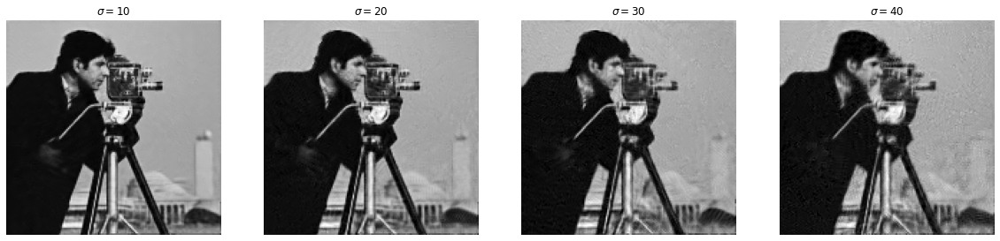


SECOND STAGE RESULTS


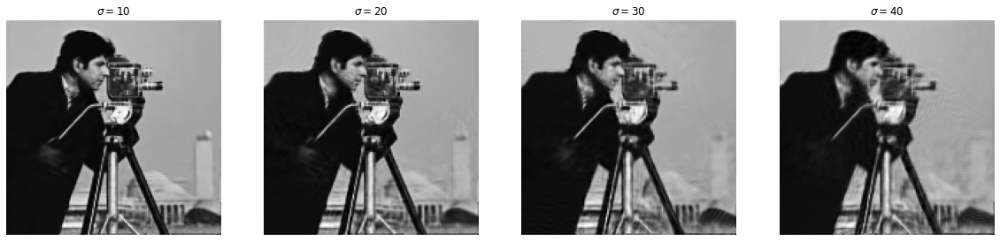


METRICS
================ Standard Deviation: 10 ================
Denoised Image (1st Stage) --- PSNR: 32.0, SSIM: 0.9436
Denoised Image (2st Stage) --- PSNR: 32.0, SSIM: 0.9498

================ Standard Deviation: 20 ================
Denoised Image (1st Stage) --- PSNR: 28.3, SSIM: 0.8726
Denoised Image (2st Stage) --- PSNR: 28.4, SSIM: 0.9141

================ Standard Deviation: 30 ================
Denoised Image (1st Stage) --- PSNR: 26.0, SSIM: 0.7917
Denoised Image (2st Stage) --- PSNR: 26.2, SSIM: 0.8772

================ Standard Deviation: 40 ================
Denoised Image (1st Stage) --- PSNR: 24.2, SSIM: 0.7116
Denoised Image (2st Stage) --- PSNR: 24.5, SSIM: 0.8305



In [ ]:
# APPLYING LPG-PCA TO CAMERAMAN IMAGE

cameramanIh, cameramanIhh = imagePipeline(cameramanI, 'cameraman')

#### Barbara

Bellow, the PCA-LPG algorithm was applied to the *Barbara* image for noise levels $\sigma = 10,20,30$ and $40$.


ORIGINAL IMAGE


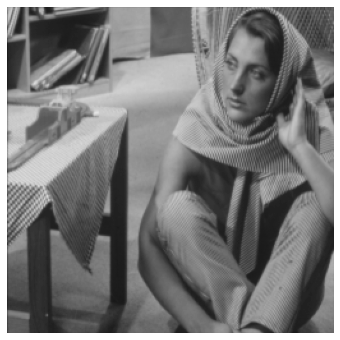

Image shape: (256, 256)

RESIZED IMAGE


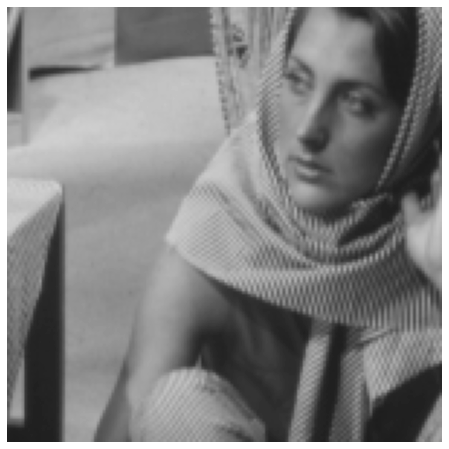

Image shape: (150, 150)


In [ ]:
# BARBARA IMAGE

barbaraI = prepareImage(path+"/paper_images/barbara.tif", 20, 170, 75, 225)

NOISY IMAGES


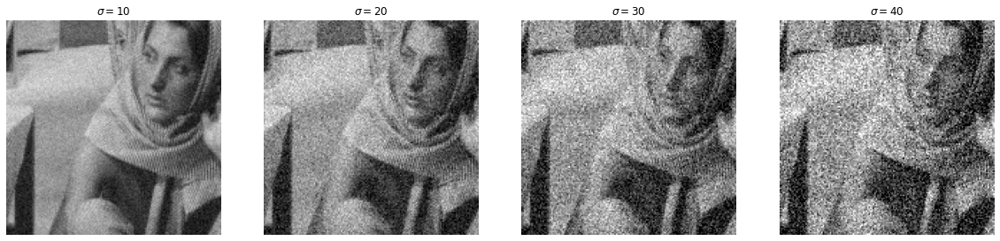


PCA-LPG ALGORITHM
================ s: 10 ================
[FIRST STAGE] Elapsed time: 27.8953s

[SECOND STAGE] Elapsed time: 35.4242s

================ s: 20 ================
[FIRST STAGE] Elapsed time: 35.0347s

[SECOND STAGE] Elapsed time: 48.4817s

================ s: 30 ================
[FIRST STAGE] Elapsed time: 30.4152s

[SECOND STAGE] Elapsed time: 61.2960s

================ s: 40 ================
[FIRST STAGE] Elapsed time: 33.0215s

[SECOND STAGE] Elapsed time: 64.2944s


FIRST STAGE RESULTS


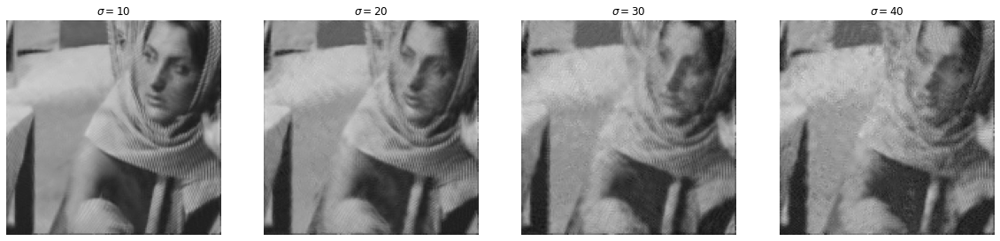


SECOND STAGE RESULTS


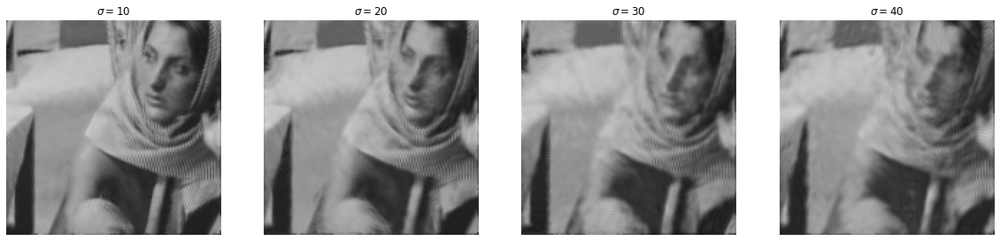


METRICS
================ Standard Deviation: 10 ================
Denoised Image (1st Stage) --- PSNR: 31.8, SSIM: 0.9358
Denoised Image (2st Stage) --- PSNR: 32.4, SSIM: 0.9409

================ Standard Deviation: 20 ================
Denoised Image (1st Stage) --- PSNR: 29.0, SSIM: 0.8467
Denoised Image (2st Stage) --- PSNR: 29.4, SSIM: 0.8788

================ Standard Deviation: 30 ================
Denoised Image (1st Stage) --- PSNR: 26.9, SSIM: 0.7455
Denoised Image (2st Stage) --- PSNR: 27.7, SSIM: 0.8106

================ Standard Deviation: 40 ================
Denoised Image (1st Stage) --- PSNR: 25.5, SSIM: 0.6708
Denoised Image (2st Stage) --- PSNR: 26.4, SSIM: 0.7710



In [ ]:
# APPLYING LPG-PCA TO BARBARA IMAGE

barbaraIh, barbaraIhh = imagePipeline(barbaraI, 'barbara')

#### Analysis

From the results obtained for the *Cameraman* and *Barbara* images, we notice a slight improvement of the PSNR metrix between the first and second stages, of less than $1\mathrm{dB}$. However the improvement of the SSIM metric is much more significant, specially for higher noise levels, reflecting the improvement in visual quality that can be observed.

Also, image edge structures were well preserved and there was no systematic introduction of any visual artifacts.

Furthermore, those particular exemples can be used to test the performance of the algorithm on some features of images that might be of interest. On the *Cameraman* case, we observe dim buildings on the background of the original image, and we see that altough the denoising of those buildings isn't as satisfactory as that of the man on the foreground, the buildings are well preserved for $\sigma = 10, 20$. But, for higher noise levels ($\sigma = 30, 40$), which are of the same order of magnitude as the average difference of pixel intensity between the buildings and the background, the building are somewhat faded on the reconstructed images.

For the *Barbara* image, we can analyse the quality of reconstruction of textures. Again, for $\sigma = 10, 20$ the preservation of textures was satisfactory, however, for higher noise levels, not only the textures started to fade on the clothes but they seemed to have been replicated over other parts of the image such as the woman's face. This might happen because the noise level becomes comparable to the magnitude of the gradients of the image, so that the distance between local windows over very different structures might become smaller, and thus bad quality samples might be used for denoising. For instance, the woman's face is surrounded by textured cloth, thus $L$ is large enough to include $K \times K$ samples that are over the cloth, the use of such samples would cause the effect that is observed.

### Hyperparameters

The hyperparameters of the PCA-LPG algorithm are:
- $L$: size of the window ($L\times L$) within which the training blocks are searched;
- $K$: size of the training blocks, yielding samples of size $K^2$;
- $c$: controls the minimum number of samples ($c \cdot K^2$); 
- $T$: a training sample is accepted if its distance to the target block is less than $T + 2\sigma^2$;
- $c_s$: controls the estimation of the residual noise after the first stage of the PCA-LPG algorithm.

In this section we shall evaluate their impact on the performance of the algorithm. For that, the algorithm will be run for the values proposed on the article (indicated in bold face), one value bellow and one above:
- $L \in \{11,\mathbf{41},61\}$
- $K \in \{3,\mathbf{5},7\}$
- $c \in \{0.1,\mathbf{8},16\}$
- $T \in \{5,\mathbf{25},50\}$
- $c_s \in \{0.1,\mathbf{0.35},0.9\}$

The image chosen for the evaluation was the *Cameraman*.


ORIGINAL IMAGE


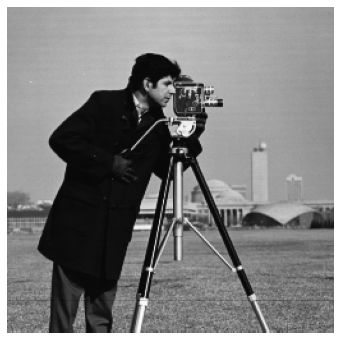

Image shape: (256, 256)

RESIZED IMAGE


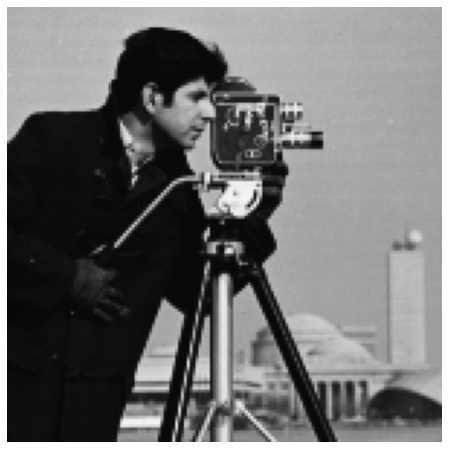

Image shape: (150, 150)


In [ ]:
# CAMERAMAN IMAGE

cameramanI = prepareImage(path+"/paper_images/cameraman.tif", 30, 180, 60, 210)

#### Size $K$ of the training blocks

Starting with the hyperparameter $K$, we shall focus on the results of the second stage of the algorithm. Visually, we see that the best results were obtained for the value proposed on the article ($K=5$) which is confirmed by the SSIM metric. Indeed, for smaller values of $K$, the size of the training blocks might too small to capture relevant structural information and for values of $K$ too large it might become too hard to find training samples which are close enough to the target block.

NOISY IMAGE


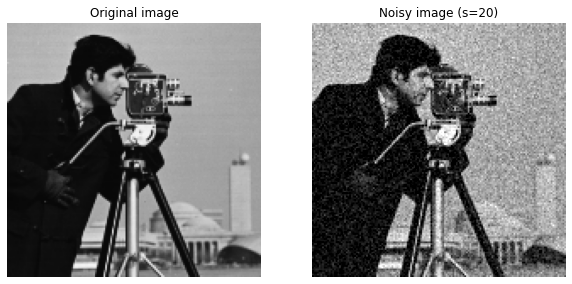


PCA-LPG ALGORITHM
================ K=3 ================
[FIRST STAGE] Elapsed time: 17.2796s

[SECOND STAGE] Elapsed time: 25.1918s

================ K=5 ================
[FIRST STAGE] Elapsed time: 44.0588s

[SECOND STAGE] Elapsed time: 67.3218s

================ K=7 ================
[FIRST STAGE] Elapsed time: 165.1882s

[SECOND STAGE] Elapsed time: 184.2604s


FIRST STAGE RESULTS


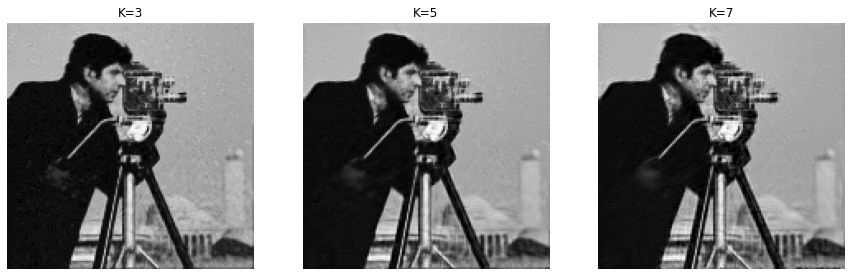


SECOND STAGE RESULTS


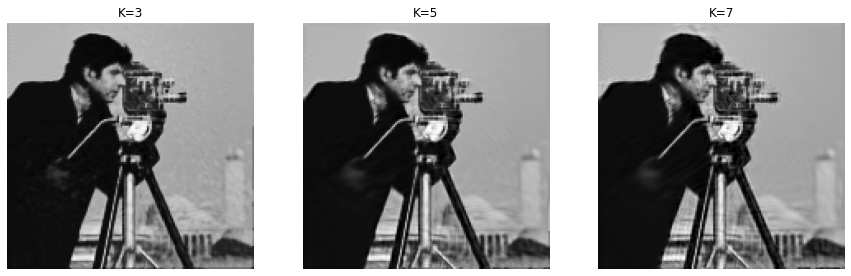


METRICS
======================= K=3 =======================
Denoised Image (1st Stage) --- PSNR: 28.3, SSIM: 0.8199
Denoised Image (2st Stage) --- PSNR: 28.5, SSIM: 0.9009

======================= K=5 =======================
Denoised Image (1st Stage) --- PSNR: 28.4, SSIM: 0.8711
Denoised Image (2st Stage) --- PSNR: 28.5, SSIM: 0.9106

======================= K=7 =======================
Denoised Image (1st Stage) --- PSNR: 28.0, SSIM: 0.8755
Denoised Image (2st Stage) --- PSNR: 28.1, SSIM: 0.9027



In [ ]:
# VARYING K PARAMETER

hyperName = 'K'
hyperValue = [3, 5, 7]

cameramanIh, cameramanIhh = hyperparameterPipeline(cameramanI, 'cameraman', hyperName, hyperValue)

#### Size $L$ of the window

For the hyperparameter $L$, both the PSNR and SSIM metrics reveal that the best results are obtained for $L=7$, which agrees with a visual diagnosis of the results. For smaller values of $L$, the window within which the training samples are searched might be to small too find a sufficient amount of relevant samples. For larger values of $L$, what can be interpreted is that for fine-grain structures incorrect non-local information might be introduced.

NOISY IMAGE


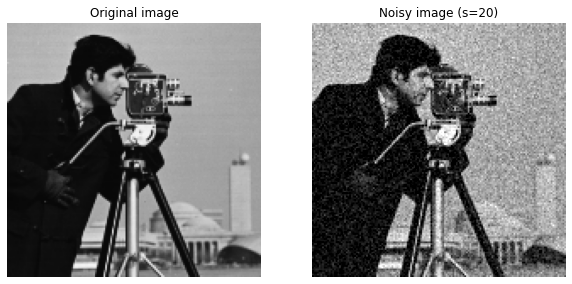


PCA-LPG ALGORITHM
================ L=11 ================


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: ComplexWarning: Casting complex values to real discards the imaginary part


[FIRST STAGE] Elapsed time: 11.2947s



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: ComplexWarning: Casting complex values to real discards the imaginary part


[SECOND STAGE] Elapsed time: 13.7602s

================ L=41 ================
[FIRST STAGE] Elapsed time: 45.5878s

[SECOND STAGE] Elapsed time: 63.6441s

================ L=61 ================
[FIRST STAGE] Elapsed time: 79.7033s

[SECOND STAGE] Elapsed time: 120.7188s


FIRST STAGE RESULTS


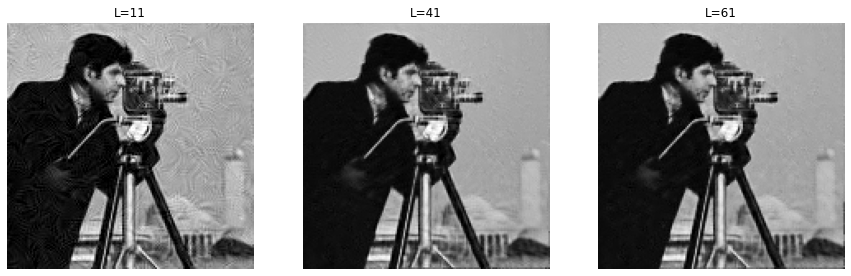


SECOND STAGE RESULTS


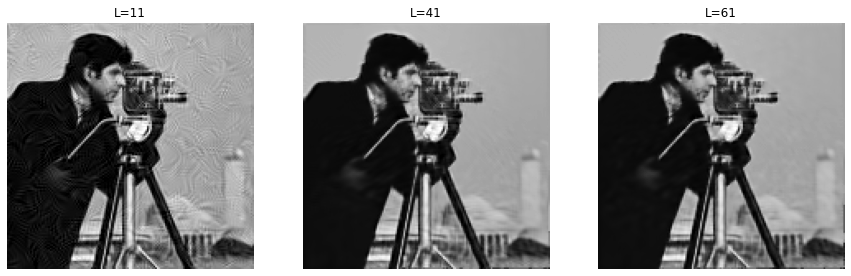


METRICS
======================= L=11 =======================
Denoised Image (1st Stage) --- PSNR: 26.5, SSIM: 0.6746
Denoised Image (2st Stage) --- PSNR: 26.9, SSIM: 0.7027

======================= L=41 =======================
Denoised Image (1st Stage) --- PSNR: 28.4, SSIM: 0.8711
Denoised Image (2st Stage) --- PSNR: 28.5, SSIM: 0.9106

======================= L=61 =======================
Denoised Image (1st Stage) --- PSNR: 28.1, SSIM: 0.8695
Denoised Image (2st Stage) --- PSNR: 28.1, SSIM: 0.9079



In [ ]:
# VARYING L PARAMETER

hyperName = 'L'
hyperValue = [11, 41, 61]

cameramanIh, cameramanIhh = hyperparameterPipeline(cameramanI, 'cameraman', hyperName, hyperValue)

#### Threshold $T$ for selecting samples

For the hyperparameter $T$, analysing the results of the second stage, the PSNR metric was unchanged and there was only a slight improvement of the SSIM metric for higher values of $T$. The small impact of this hyperparameter is due to the fact that the training samples are accepted not only according to the threshold that depends on $T$ but also according to a minimum number of samples $c \cdot K^2$. What can be interpreted is that for this particular image, the minimum number of samples is more relevant then the threshold, at least for the values of $T$ that were tested.

NOISY IMAGE


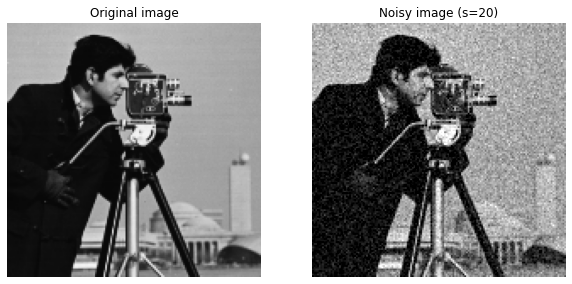


PCA-LPG ALGORITHM
================ T=5 ================
[FIRST STAGE] Elapsed time: 43.9683s

[SECOND STAGE] Elapsed time: 58.4459s

================ T=25 ================
[FIRST STAGE] Elapsed time: 51.6542s

[SECOND STAGE] Elapsed time: 71.8641s

================ T=50 ================
[FIRST STAGE] Elapsed time: 43.8963s

[SECOND STAGE] Elapsed time: 68.0119s


FIRST STAGE RESULTS


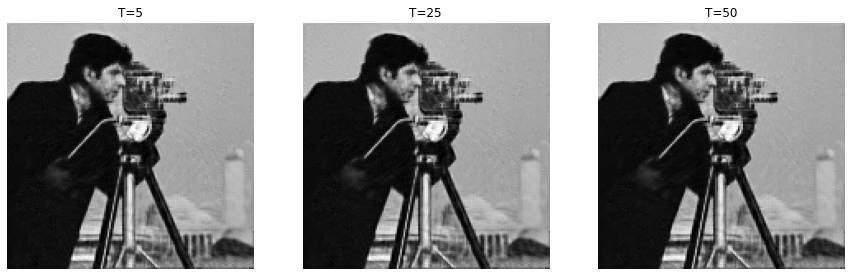


SECOND STAGE RESULTS


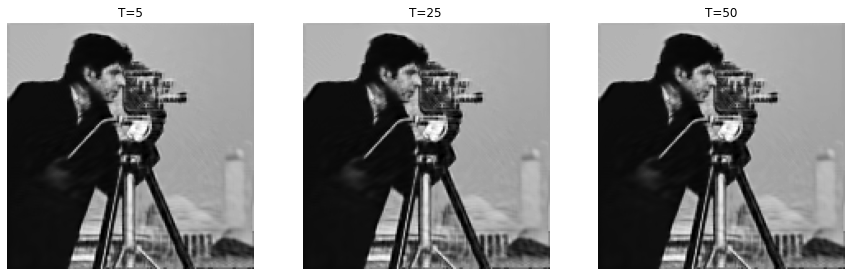


METRICS
======================= T=5 =======================
Denoised Image (1st Stage) --- PSNR: 28.3, SSIM: 0.8664
Denoised Image (2st Stage) --- PSNR: 28.5, SSIM: 0.9099

======================= T=25 =======================
Denoised Image (1st Stage) --- PSNR: 28.4, SSIM: 0.8711
Denoised Image (2st Stage) --- PSNR: 28.5, SSIM: 0.9106

======================= T=50 =======================
Denoised Image (1st Stage) --- PSNR: 28.4, SSIM: 0.8763
Denoised Image (2st Stage) --- PSNR: 28.5, SSIM: 0.9113



In [ ]:
# VARYING T PARAMETER

hyperName = 'T'
hyperValue = [5, 25, 50]

cameramanIh, cameramanIhh = hyperparameterPipeline(cameramanI, 'cameraman', hyperName, hyperValue)

#### Constant $c_s$ for residual noise update

For the hyperparameter $c_s$ it is interesting to analyse the improvement between the first and second stages of the algorithm as it controls the noise level update between them. The best results are observed for $c_s=0.35$; for lower values the residual noise is underestimated and noise can still be observed in the reconstructed image; for higher values the noise is superestimated and the image becomes blurred.

NOISY IMAGE


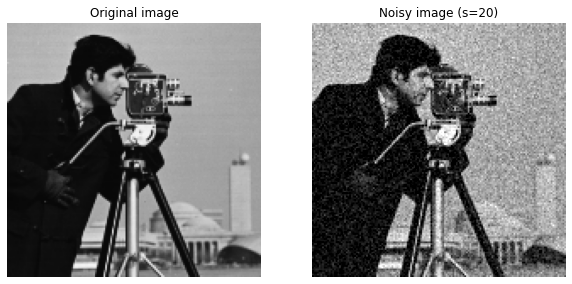


PCA-LPG ALGORITHM
================ cs=0.1 ================
[FIRST STAGE] Elapsed time: 42.3807s

[SECOND STAGE] Elapsed time: 59.1676s

================ cs=0.35 ================
[FIRST STAGE] Elapsed time: 39.9200s

[SECOND STAGE] Elapsed time: 55.2893s

================ cs=0.9 ================
[FIRST STAGE] Elapsed time: 39.6167s

[SECOND STAGE] Elapsed time: 57.5774s


FIRST STAGE RESULTS


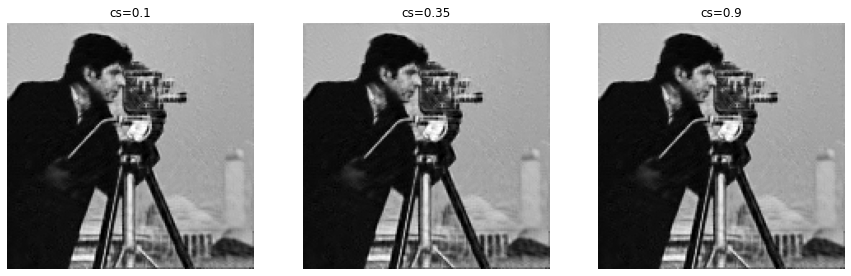


SECOND STAGE RESULTS


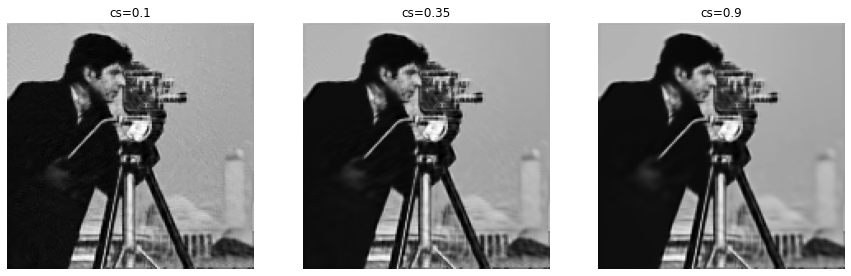


METRICS
======================= cs=0.1 =======================
Denoised Image (1st Stage) --- PSNR: 28.4, SSIM: 0.8711
Denoised Image (2st Stage) --- PSNR: 28.4, SSIM: 0.8785

======================= cs=0.35 =======================
Denoised Image (1st Stage) --- PSNR: 28.4, SSIM: 0.8711
Denoised Image (2st Stage) --- PSNR: 28.5, SSIM: 0.9106

======================= cs=0.9 =======================
Denoised Image (1st Stage) --- PSNR: 28.4, SSIM: 0.8711
Denoised Image (2st Stage) --- PSNR: 28.1, SSIM: 0.9057



In [ ]:
# VARYING cs PARAMETER

hyperName = 'cs'
hyperValue = [0.1, 0.35, 0.9]

cameramanIh, cameramanIhh = hyperparameterPipeline(cameramanI, 'cameraman', hyperName, hyperValue)

#### Constant $c$ for minimum number of samples

Finally, for the hyperparameter $c$, the best results were obtained for $c=8$; for smaller values, the number of selected samples is insufficient to compute properly the PCA transformation; for higher values, the LPG algorithm is forced to select samples which might be too distant to the target block.

NOISY IMAGE


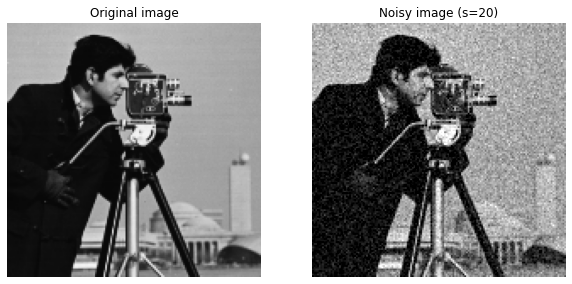


PCA-LPG ALGORITHM
================ c=0.1 ================


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: ComplexWarning: Casting complex values to real discards the imaginary part


[FIRST STAGE] Elapsed time: 34.8434s



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: ComplexWarning: Casting complex values to real discards the imaginary part


[SECOND STAGE] Elapsed time: 50.7061s

================ c=8 ================
[FIRST STAGE] Elapsed time: 39.4227s

[SECOND STAGE] Elapsed time: 56.8750s

================ c=16 ================
[FIRST STAGE] Elapsed time: 46.2147s

[SECOND STAGE] Elapsed time: 61.0323s


FIRST STAGE RESULTS


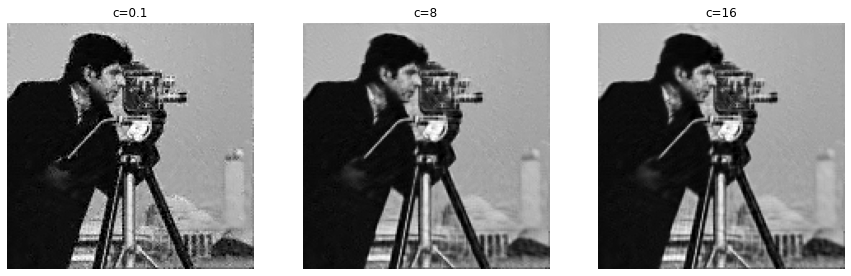


SECOND STAGE RESULTS


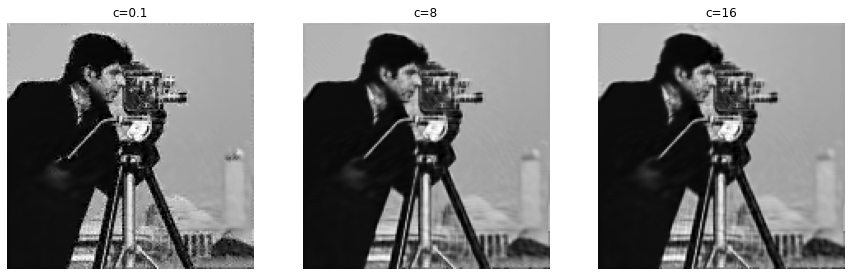


METRICS
======================= c=0.1 =======================
Denoised Image (1st Stage) --- PSNR: 26.5, SSIM: 0.8448
Denoised Image (2st Stage) --- PSNR: 26.9, SSIM: 0.8969

======================= c=8 =======================
Denoised Image (1st Stage) --- PSNR: 28.4, SSIM: 0.8711
Denoised Image (2st Stage) --- PSNR: 28.5, SSIM: 0.9106

======================= c=16 =======================
Denoised Image (1st Stage) --- PSNR: 28.1, SSIM: 0.8762
Denoised Image (2st Stage) --- PSNR: 28.0, SSIM: 0.9069



In [ ]:
# VARYING c PARAMETER

hyperName = 'c'
hyperValue = [0.1, 8, 16]

cameramanIh, cameramanIhh = hyperparameterPipeline(cameramanI, 'cameraman', hyperName, hyperValue)

### Applying the PCA-LPG algorithm to medical images

In this part of the project, the algorithm will be applied to medical images and the results will be evaluated according to the  PSNR and SSIM metrics.

For this purpose, brain and lung scans were selected. The PCA-LPG method will be used to remove noise artificially added to the original images, with attention to the preservation of characteristics of the image relevant to medical analysis.

#### Brain Scan: Axial Section - High contrast

In the first presented brain image, which is an axial section of a MRI scan with contrast, there are some structures that should be preserved for further medical analysis. For that reason, the application of the denoising PCA-LPG algorithm should not remove these important regions. In this specific case, the brain presents a tumor identifiable by the white globule on the left side of the brain. Besides, it is essential to preserve the white points inside the white matter, along with the shape of the white matter itself.

Observing the results of the first and the second stages, it is possible to conclude that the algorithm was capable of preserving the most important regions of the brain, even with a noise standard deviation equals to 40. The white matter was the only part that become more blurred as the noise variation increased, since the algorithm is recognized for smoothing homogenous regions. Nevertheless, the result is still satisfactory.

With regard to the PSNR and SSIM metrics, as can be seen below, the SSIM index increases considerably between the first and second stages, which indicates that the visual quality of the image improved with the procedure.


ORIGINAL IMAGE


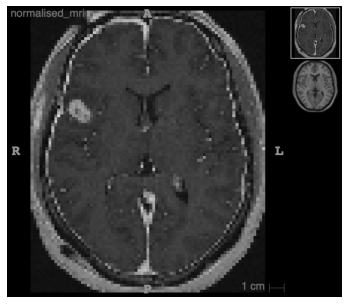

Image shape: (644, 742)

RESIZED IMAGE


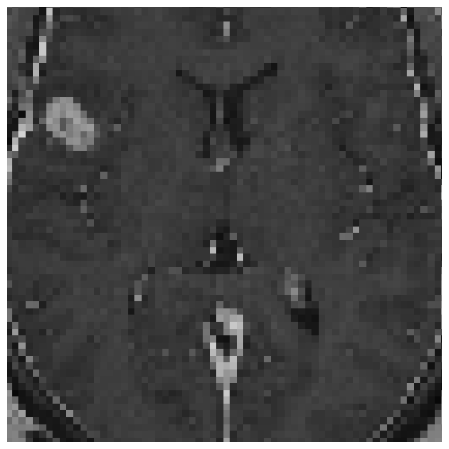

Image shape: (420, 420)


In [ ]:
# BRAIN SCAN - AXIAL SECTION - HIGH CONTRAST

brainI = prepareImage(path+"/medical_images/IMA201_Medical_images/brain1.png", 
                      rx1=120, rx2=540, ry1=100, ry2=520)

NOISY IMAGES


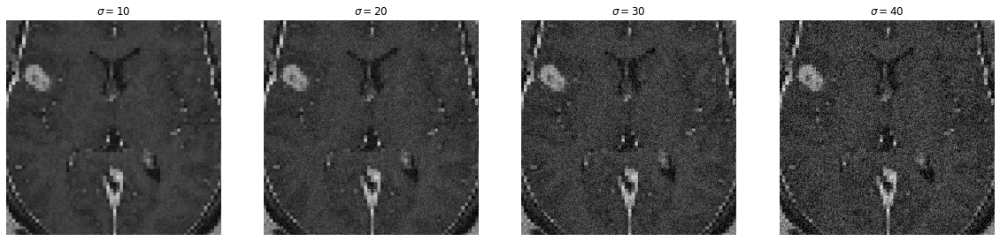


PCA-LPG ALGORITHM
================ s: 10 ================
[FIRST STAGE] Elapsed time: 336.4305s

[SECOND STAGE] Elapsed time: 585.6935s

================ s: 20 ================
[FIRST STAGE] Elapsed time: 373.0765s

[SECOND STAGE] Elapsed time: 598.1806s

================ s: 30 ================
[FIRST STAGE] Elapsed time: 363.7526s

[SECOND STAGE] Elapsed time: 609.6298s

================ s: 40 ================
[FIRST STAGE] Elapsed time: 375.1903s

[SECOND STAGE] Elapsed time: 621.4533s


FIRST STAGE RESULTS


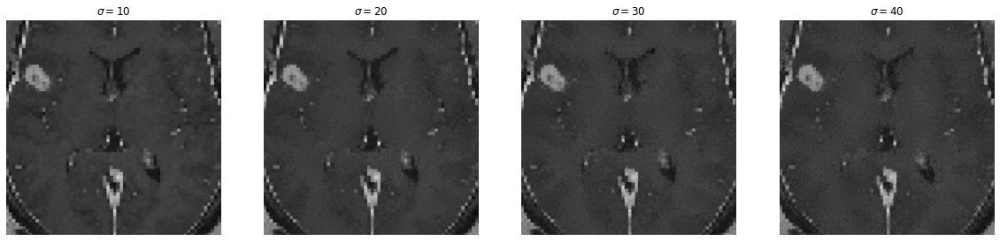


SECOND STAGE RESULTS


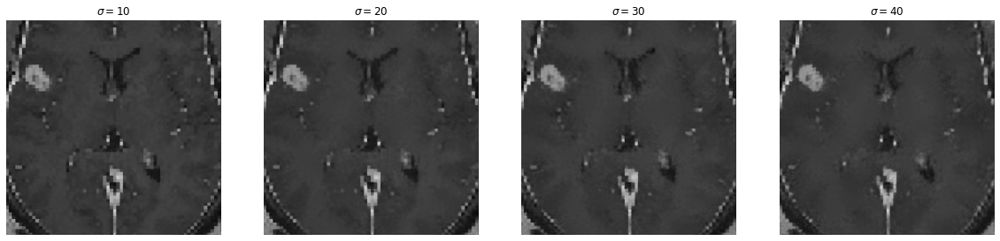


METRICS
================ Standard Deviation: 10 ================
Denoised Image (1st Stage) --- PSNR: 35.2, SSIM: 0.9169
Denoised Image (2st Stage) --- PSNR: 35.2, SSIM: 0.9303

================ Standard Deviation: 20 ================
Denoised Image (1st Stage) --- PSNR: 31.8, SSIM: 0.8179
Denoised Image (2st Stage) --- PSNR: 32.3, SSIM: 0.8851

================ Standard Deviation: 30 ================
Denoised Image (1st Stage) --- PSNR: 29.7, SSIM: 0.7184
Denoised Image (2st Stage) --- PSNR: 30.8, SSIM: 0.8570

================ Standard Deviation: 40 ================
Denoised Image (1st Stage) --- PSNR: 28.1, SSIM: 0.6264
Denoised Image (2st Stage) --- PSNR: 29.4, SSIM: 0.8298



In [ ]:
# APPLYING LPG-PCA TO BRAIN IMAGE 1

brainIh, brainIhh = imagePipeline(brainI, 'medBrain')

#### Brain Scan: Axial Section - Low contrast

Comparing the Axial Section Brain images, the notable difference between both is the contrast.

For this kind of scan, the analyse goal also differentiates from the high contrast scan, since the interest in this one is to preserve the white matter and the gray matter after the image processing.

For the algorithm LPG-PCA denoising, after applying different levels of noise, $σ=[10,20,30,40]$, this scan preserves the important details highlighted previously. This conclusion can also be taken from the algorithm metrics, mostly for the structural similarity metric, that has a value greater than $90\%$ after the second stage.

Furthermore, since the low contrast image has a considerable size of homogenous region, the metric evaluations are higher than those from the high contrast image, as the algorithm denoise efficiently this kind of regions. 


ORIGINAL IMAGE


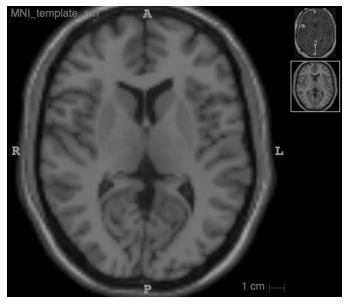

Image shape: (644, 742)

RESIZED IMAGE


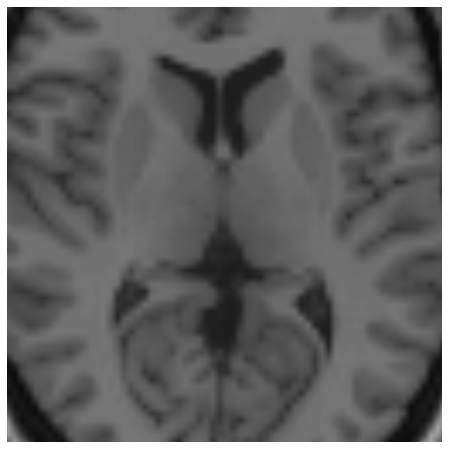

Image shape: (420, 420)


In [ ]:
# APPLYING LPG-PCA TO BRAIN IMAGE 2

brainII = prepareImage(path+"/medical_images/IMA201_Medical_images/brain1_hc.png", 
                      rx1=120, rx2=540, ry1=100, ry2=520)

NOISY IMAGES


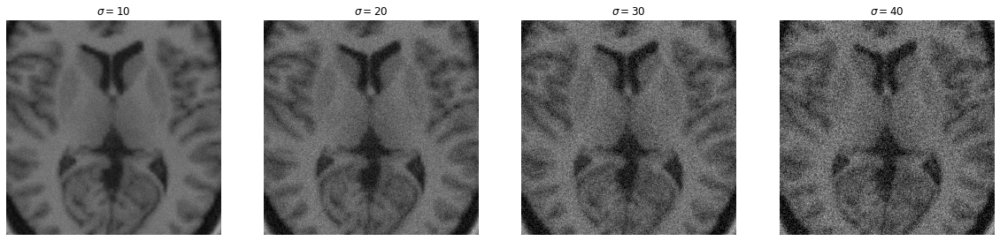


PCA-LPG ALGORITHM
================ s: 10 ================
[FIRST STAGE] Elapsed time: 341.7269s

[SECOND STAGE] Elapsed time: 552.6882s

================ s: 20 ================
[FIRST STAGE] Elapsed time: 363.0255s

[SECOND STAGE] Elapsed time: 668.2412s

================ s: 30 ================
[FIRST STAGE] Elapsed time: 394.5039s

[SECOND STAGE] Elapsed time: 693.9652s

================ s: 40 ================
[FIRST STAGE] Elapsed time: 411.9735s

[SECOND STAGE] Elapsed time: 705.5420s


FIRST STAGE RESULTS


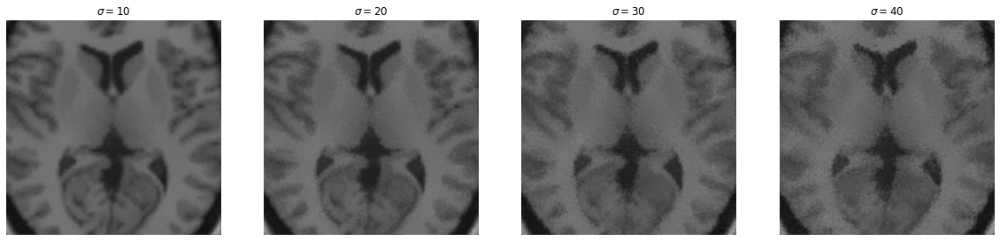


SECOND STAGE RESULTS


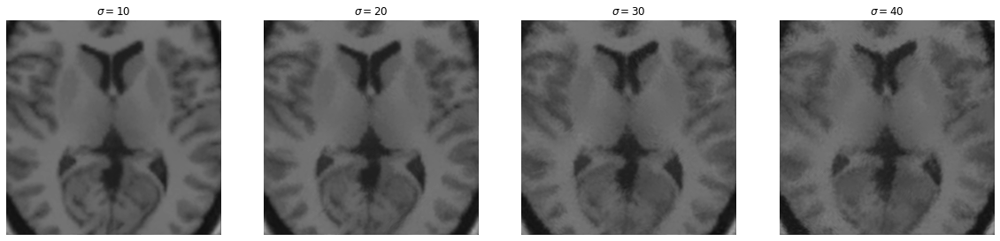


METRICS
================ Standard Deviation: 10 ================
Noisy Image ------------------ PSNR: 28.1, SSIM: 0.4581
Denoised Image (1st Stage) --- PSNR: 39.3, SSIM: 0.9543
Denoised Image (2st Stage) --- PSNR: 41.2, SSIM: 0.9812

================ Standard Deviation: 20 ================
Noisy Image ------------------ PSNR: 22.1, SSIM: 0.1828
Denoised Image (1st Stage) --- PSNR: 34.4, SSIM: 0.8486
Denoised Image (2st Stage) --- PSNR: 37.4, SSIM: 0.9594

================ Standard Deviation: 30 ================
Noisy Image ------------------ PSNR: 18.6, SSIM: 0.0923
Denoised Image (1st Stage) --- PSNR: 31.5, SSIM: 0.7345
Denoised Image (2st Stage) --- PSNR: 34.8, SSIM: 0.9343

================ Standard Deviation: 40 ================
Noisy Image ------------------ PSNR: 16.1, SSIM: 0.0546
Denoised Image (1st Stage) --- PSNR: 29.4, SSIM: 0.6322
Denoised Image (2st Stage) --- PSNR: 33.0, SSIM: 0.9116



In [ ]:
# APPLYING LPG-PCA TO BRAIN IMAGE 2

brainIIh, brainIIhh = imagePipeline(brainII, 'medBrainII')

#### Brain Scan: Sagittal Section

In this image, of a sagital section of a MRI brain scan with contrast, the elements that should remain after the denoising algorithm should be the tumor nodes (white globules in the top left side of the cortex) and the white points inside the white matter.

The second stage of the LPG-PCA denoising is good, considering that the most important elements remain in the image and can be further analysed by neurologists.


ORIGINAL IMAGE


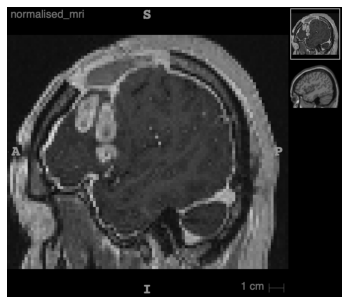

Image shape: (644, 744)

RESIZED IMAGE


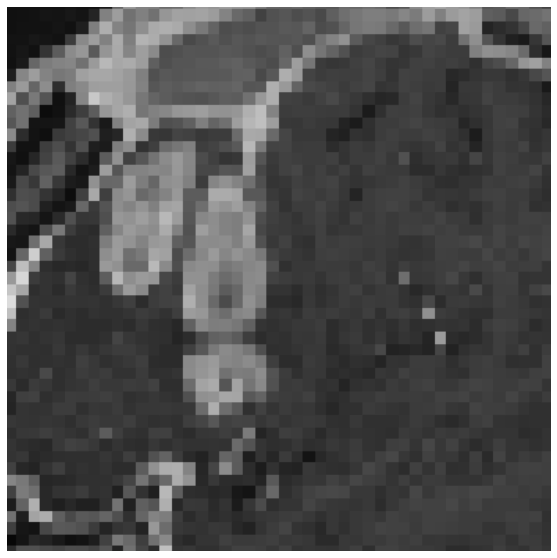

Image shape: (300, 300)


In [ ]:
# BRAIN IMAGE 2

brainIII = prepareImage(path+"/medical_images/IMA201_Medical_images/brain2.png", 
                      rx1=120, rx2=420, ry1=100, ry2=400)

NOISY IMAGES


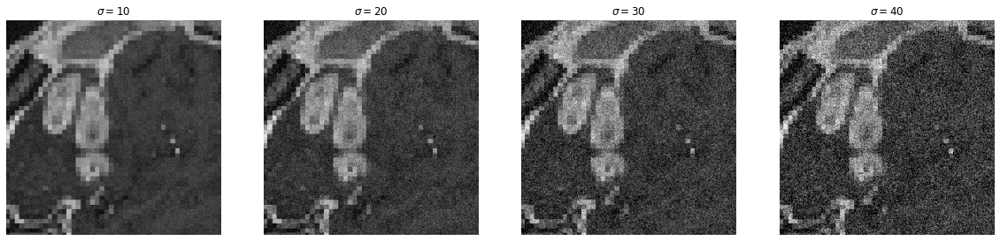


PCA-LPG ALGORITHM
================ s: 10 ================
[FIRST STAGE] Elapsed time: 159.2813s

[SECOND STAGE] Elapsed time: 252.5294s

================ s: 20 ================
[FIRST STAGE] Elapsed time: 168.1069s

[SECOND STAGE] Elapsed time: 276.9212s

================ s: 30 ================
[FIRST STAGE] Elapsed time: 178.7518s

[SECOND STAGE] Elapsed time: 320.6354s

================ s: 40 ================
[FIRST STAGE] Elapsed time: 188.9195s

[SECOND STAGE] Elapsed time: 319.4912s


FIRST STAGE RESULTS


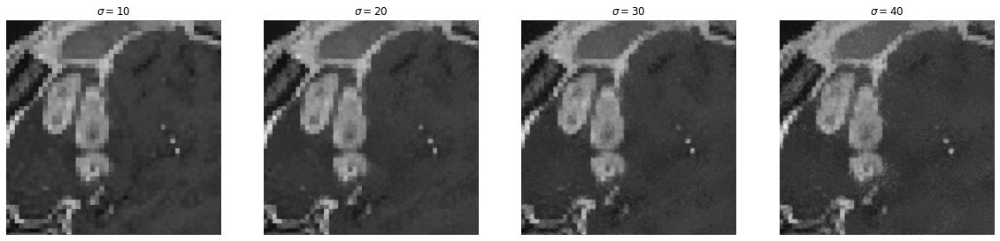


SECOND STAGE RESULTS


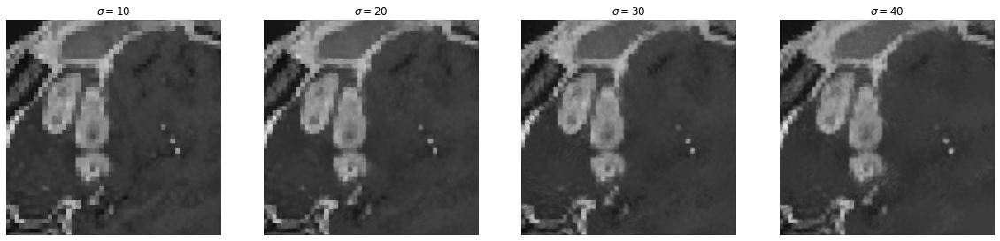


METRICS
=============== Standard Deviation: 10 ===============
Noisy Image ------------------ PSNR: 28.1, SSIM: 0.5868
Denoised Image (1st Stage) --- PSNR: 35.0, SSIM: 0.9125
Denoised Image (2st Stage) --- PSNR: 35.3, SSIM: 0.9230

=============== Standard Deviation: 20 ===============
Noisy Image ------------------ PSNR: 22.1, SSIM: 0.3212
Denoised Image (1st Stage) --- PSNR: 31.0, SSIM: 0.8144
Denoised Image (2st Stage) --- PSNR: 31.6, SSIM: 0.8676

=============== Standard Deviation: 30 ===============
Noisy Image ------------------ PSNR: 18.6, SSIM: 0.2039
Denoised Image (1st Stage) --- PSNR: 28.7, SSIM: 0.7132
Denoised Image (2st Stage) --- PSNR: 29.5, SSIM: 0.8225

=============== Standard Deviation: 40 ===============
Noisy Image ------------------ PSNR: 16.1, SSIM: 0.1419
Denoised Image (1st Stage) --- PSNR: 27.0, SSIM: 0.6241
Denoised Image (2st Stage) --- PSNR: 28.1, SSIM: 0.7844



In [ ]:
# APPLYING LPG-PCA TO BRAIN IMAGE 2

brainIIIh, brainIIIhh = imagePipeline(brainIII, 'medBrainIII')

#### Lung Scan

For the considered lung image, the image is resized to treat only the most important regions that contain structures we would like to remain after the application of the denoising algorithm. In this case, the airways of lungs are important elements to assess well the health of the patient's lung patient. The fissures (thin white line crossing the left side of the lung) are also of interest.

The main results are good. One possible analysis is that, when the noise standard deviation is considerably large, the most important regions lose some contrast, especially the fissure. For $\sigma=40$, it is still possible to observe these regions, but in the case of a higher $\sigma$, they could be even less apparent after the denoising algorithm.


ORIGINAL IMAGE


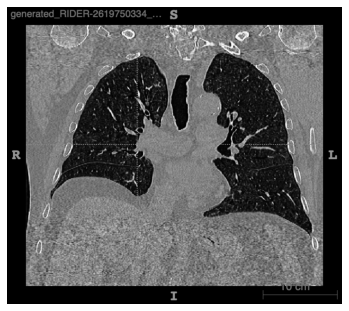

Image shape: (644, 726)

RESIZED IMAGE


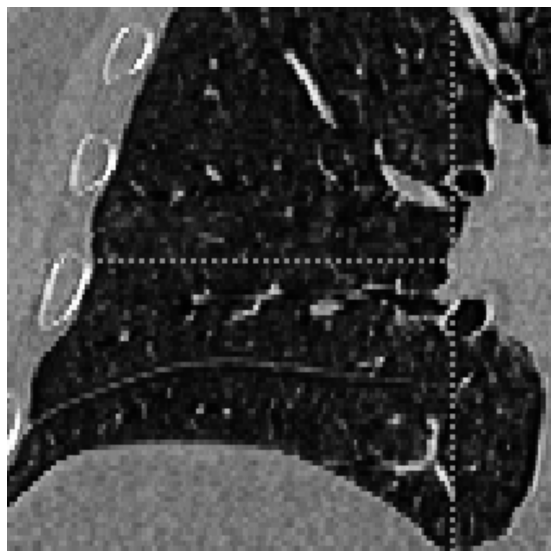

Image shape: (210, 210)


In [ ]:
# LUNG IMAGE

lungI = prepareImage(path+"/medical_images/IMA201_Medical_images/lung.png", 
                     rx1=200, rx2=410, ry1=110, ry2=320)

NOISY IMAGES


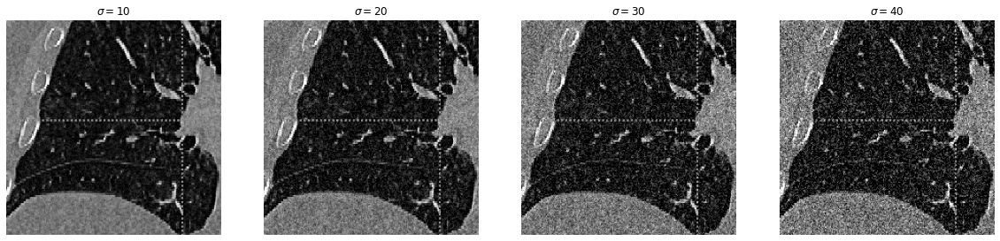


PCA-LPG ALGORITHM
================ s: 10 ================
[FIRST STAGE] Elapsed time: 59.8258s

[SECOND STAGE] Elapsed time: 90.9664s

================ s: 20 ================
[FIRST STAGE] Elapsed time: 63.4816s

[SECOND STAGE] Elapsed time: 117.0101s

================ s: 30 ================
[FIRST STAGE] Elapsed time: 69.8357s

[SECOND STAGE] Elapsed time: 131.9081s

================ s: 40 ================
[FIRST STAGE] Elapsed time: 74.4564s

[SECOND STAGE] Elapsed time: 141.7300s


FIRST STAGE RESULTS


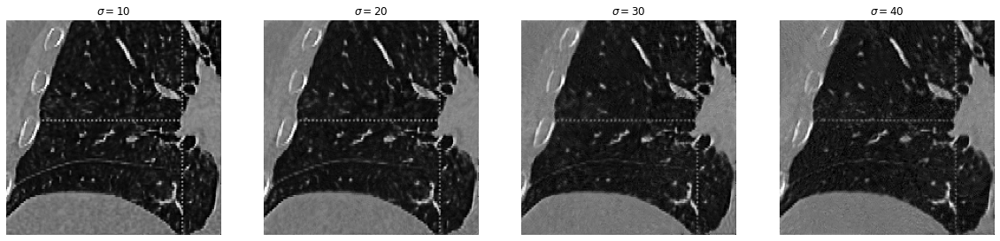


SECOND STAGE RESULTS


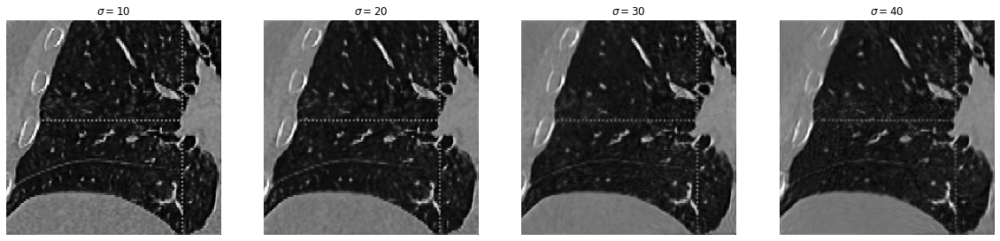


METRICS
=============== Standard Deviation: 10 ===============
Noisy Image ------------------ PSNR: 28.1, SSIM: 0.8064
Denoised Image (1st Stage) --- PSNR: 30.7, SSIM: 0.8788
Denoised Image (2st Stage) --- PSNR: 30.6, SSIM: 0.8772

=============== Standard Deviation: 20 ===============
Noisy Image ------------------ PSNR: 22.1, SSIM: 0.5678
Denoised Image (1st Stage) --- PSNR: 27.0, SSIM: 0.7604
Denoised Image (2st Stage) --- PSNR: 27.1, SSIM: 0.7609

=============== Standard Deviation: 30 ===============
Noisy Image ------------------ PSNR: 18.6, SSIM: 0.4134
Denoised Image (1st Stage) --- PSNR: 24.7, SSIM: 0.6553
Denoised Image (2st Stage) --- PSNR: 24.7, SSIM: 0.6628

=============== Standard Deviation: 40 ===============
Noisy Image ------------------ PSNR: 16.1, SSIM: 0.3137
Denoised Image (1st Stage) --- PSNR: 23.3, SSIM: 0.5747
Denoised Image (2st Stage) --- PSNR: 23.4, SSIM: 0.5928



In [ ]:
# APPLYING LPG-PCA TO LUNG

lungIh, lungIhh = imagePipeline(lungI, 'medLung')

## Conclusion

In conclusion, the implementation of the LPG-PCA algorithm was instrumental to properly understanding each part of the article, including the mathematics, coding and applications to real and synthetic images. 

## Bibliography

[1] Lei Zhang et al. “Two-stage image denoising by principal component analysis with local pixel grouping”. In: *Pattern Recognition* 43 (2010), pp. 1531–1549. doi: 10.1016/j.patcog.2009.09.023. url: https://www.sciencedirect.com/science/article/pii/S0031320309003677

[2] Wikipedia. "Peak signal-to-noise ratio". url: https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio.

[3] Wikipedia. "Structural similarity". url: https://en.wikipedia.org/wiki/Structural_similarity.